### IMPORTS

In [1]:
import torch
torch.manual_seed(0)
import torchvision
import numpy as np
import matplotlib.pyplot as plt
import torchvision.models as models
from torchvision import transforms
from IPython.display import display
import PIL
import cv2
from PIL import ImageFilter

from utils import ColumnsOrientationClassifier
from torchvision import transforms
from torchvision.transforms.functional import crop

### IMAGENET UTILS

In [2]:
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

def preprocess_image(image):
    image = (image - mean) / std
    image = np.expand_dims(image, axis=0).transpose(0,3,1,2)
    return torch.Tensor(image)

def deprocess_image(tensor):
    tensor = ((tensor * std) + mean)
    tensor = np.uint8(tensor * 255.0)
    return PIL.Image.fromarray(tensor)

### TEST IMAGE

In [15]:
# TEST_IMAGE = PIL.Image.open("./test_images/candle.jpg")
# display(TEST_IMAGE)
# preprocessed_image = preprocess_image(np.asarray(TEST_IMAGE)/255.0)

def crop1200(image):
    return crop(image, 0, 0, 1200, 1200)

my_transform2 = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    ])
my_transform = transforms.Compose([
        transforms.Resize(1200),
        transforms.Lambda(crop1200),
    ])

TEST_IMAGE = cv2.imread('/home/alexander/Documents/cnn_explainer/pictures_to_explain/np/f90daf2c-b7c0-4d47-8f8f-0e1f6a6278a4-01_180.png')
image_cut = my_transform(PIL.Image.fromarray(np.uint8(TEST_IMAGE)))
preprocessed_image = my_transform2(image_cut).unsqueeze(0).float()

### MODEL

In [16]:
# model = models.resnet18(pretrained=True)
# model.cuda()
# model.eval()
# print(model)

classifier = ColumnsOrientationClassifier(on_gpu=False, checkpoint_path="./")
model = classifier.net.resnet18
# print(model)
# print(list(model.modules()))

INIT


### ACTIVATIONS

In [17]:
class ActivationsExtractor():
    
    def __init__(self, module):
        self.hook = module.register_forward_hook(self.hook_fn)
        
    def hook_fn(self, module, input, output):
        self.features = output

In [18]:
layer = list(model.children())[-4][0].conv2 # last non-output layer
print(layer)

Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)


In [19]:
activations = ActivationsExtractor(layer) # activations' hook

In [20]:
with torch.no_grad():
    _ = model(preprocessed_image) # forward pass to collect activations

In [21]:
print(_)

tensor([[-4.9173,  4.8534,  8.2050, -1.9986, -1.9866, -3.3042]])


In [22]:
average_activations_per_filters = [activations.features[0, i].mean().item() for i in range(activations.features.shape[1])]

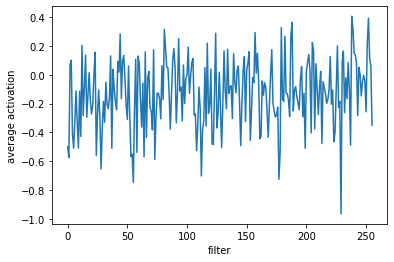

In [23]:
fig = plt.plot(average_activations_per_filters)
ax = fig[0].axes
ax.set_xlabel("filter")
ax.set_ylabel("average activation")
plt.show()

In [24]:
most_activated_filter_idx = np.argmax(average_activations_per_filters)
print(most_activated_filter_idx)

238


### FEATURES

In [13]:
def visualize(lr, steps, size, upscales, upscale_factor):
    img = np.uint8(np.random.uniform(0, 1, (size, size, 3)))
    
    for _ in range(upscales):
        
        img_var = preprocess_image(img).clone().detach().requires_grad_(True)
        optimizer = torch.optim.Adam([img_var], lr=lr, weight_decay=1e-6)

        for _ in range(steps):
            optimizer.zero_grad()
            model(img_var)
            loss = -activations.features[0, most_activated_filter_idx].mean()
            loss.backward()
            optimizer.step()

        img = deprocess_image(img_var.data.cpu().numpy()[0].transpose(1,2,0))
        display(img)

        size = int(upscale_factor * size) 
        img = img.resize((size, size)) 
        img = img.filter(ImageFilter.BLUR)
        img = np.asarray(img) / 255.0

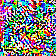

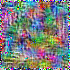

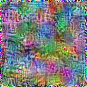

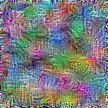

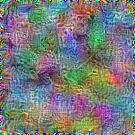

...

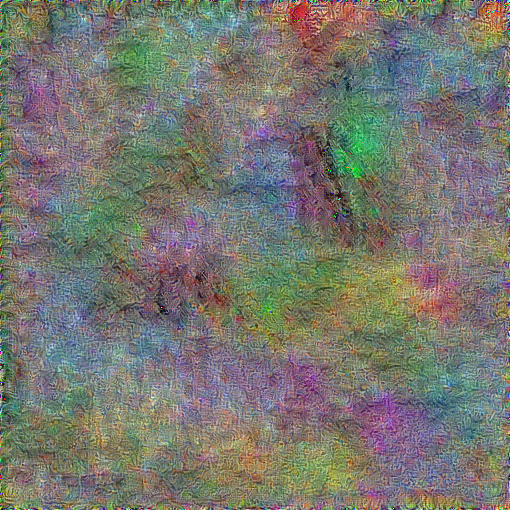

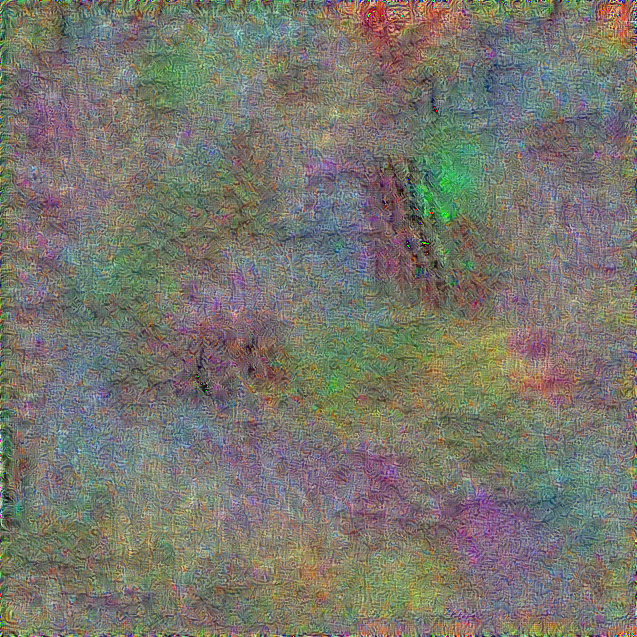

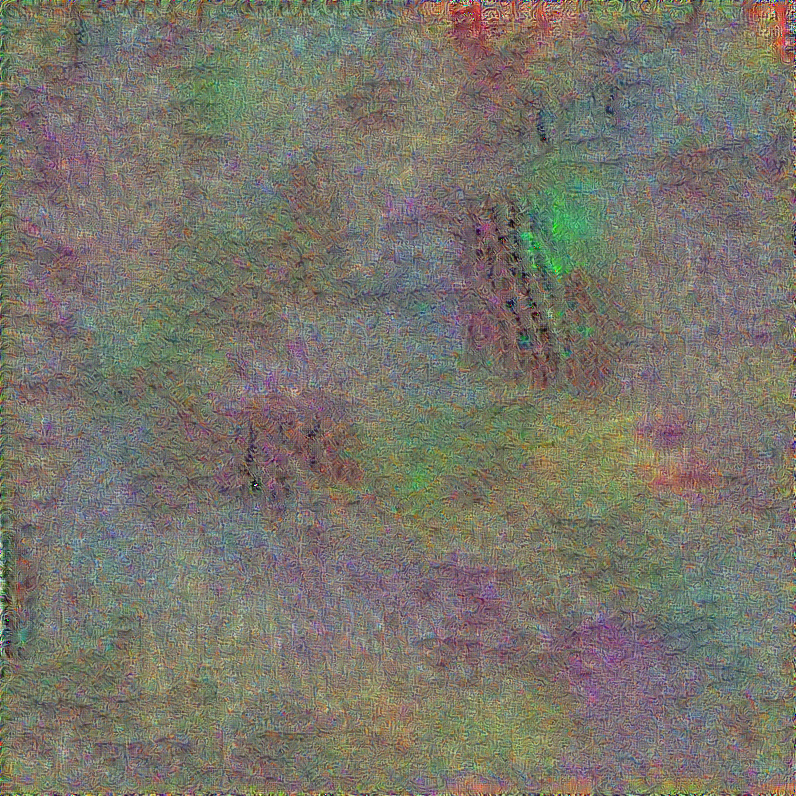

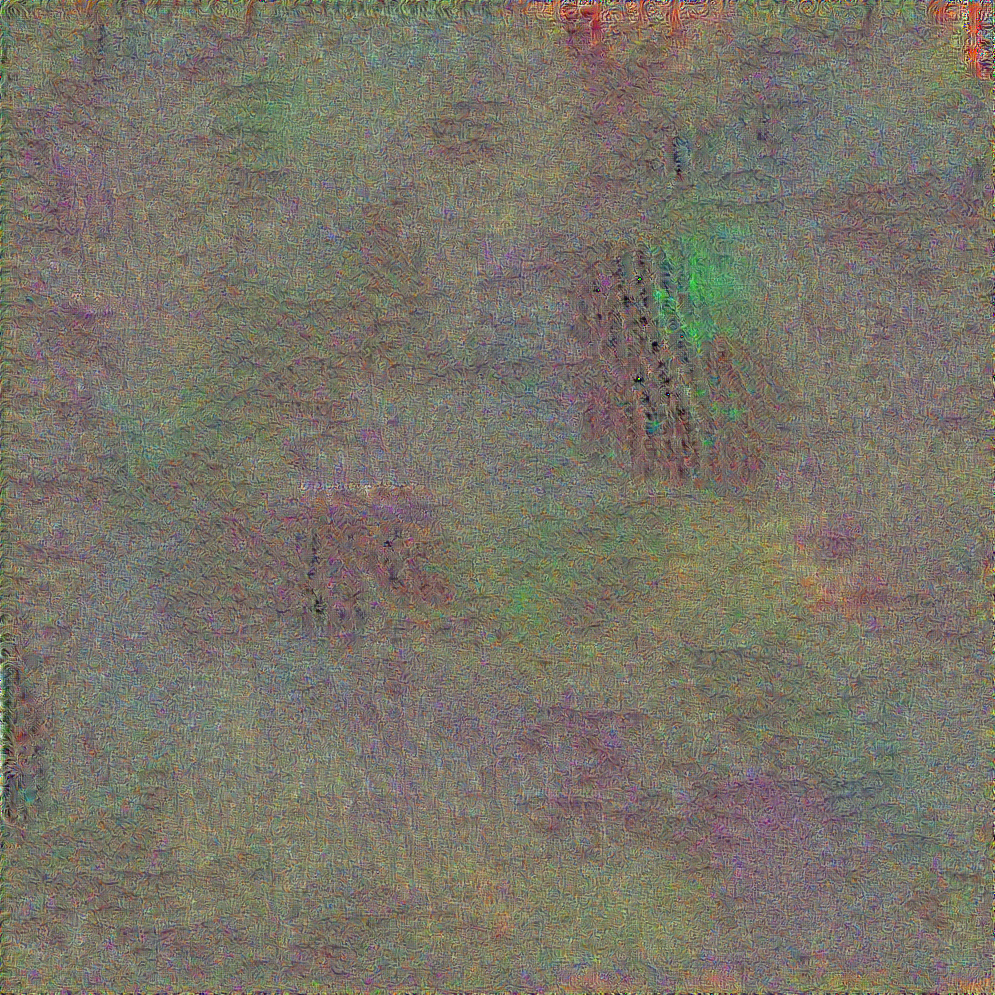

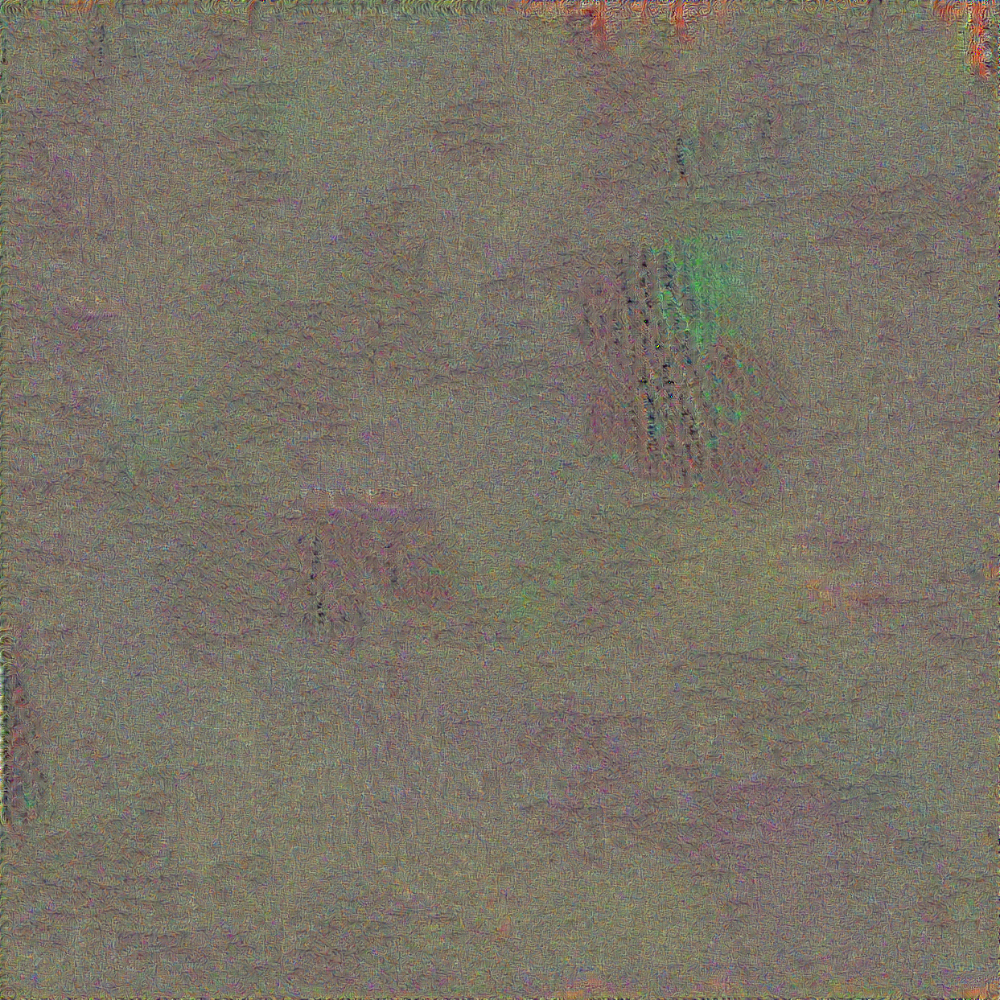

In [14]:
visualize(lr=0.075,
          size=56,
          steps=25,
          upscales=15,
          upscale_factor=1.25)